<a href="https://colab.research.google.com/github/Sopralapanca/Pattern-Recognition/blob/main/ISPR_MIDTERM1_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

All the image processing assignments require to use the following dataset:

http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip

The dataset includes original images as well as their semantic segmentation in 9 object classes (i.e. the image files whose name ends  in “_GT”, where each pixel has a value which is the identifier of the semantic class associated to it).  Each file has a name starting with a number from 1 to 8, which indicates the thematic subset of the image, followed by the rest of the file name. This tematic subset can be used for instance as a class for the full image in image classification tasks.

**Assignment 4**

Perform image segmentation on all images in the dataset, using the normalized cut algorithm running on the top of superpixels rather than on raw pixels. For each image compute an accuracy metric (which one it is up to you to decide) measuring the overlap between the image segments identified by NCUT and the ground truth semantic segmentation. Provide a table summarizing the average accuracy on all images (for the different visual classes), plus present 2 examples of images that are well-segmented (according to the above defined metric).

Hint: in Python, you have an NCut implementation in the scikit-image library; in Matlab, you can use the original NCut implementation here. Superpixels are implemented both in Matlab as well as in OpenCV. Feel free to pickup the implementation you liked most (and motivate the choice).

In [1]:
%%capture
!pip install networkx==2.8

# Useful packages

In [2]:
import cv2
from matplotlib import pyplot as plt
import os
import numpy as np
from matplotlib.pyplot import figure

# Loading the dataset

In [3]:
%%capture
!git clone https://github.com/Sopralapanca/Pattern-Recognition.git

In [4]:
%%capture
!unzip "/content/Pattern-Recognition/dataset/msrc_objcategimagedatabase_v1.zip" -d "/content/Pattern-Recognition/dataset/"

# Plot one normal image and one segmented image from the dataset

In [5]:
data_path = "/content/Pattern-Recognition/dataset/MSRC_ObjCategImageDatabase_v1"
images_names = []
for file in sorted(os.listdir(data_path)):
    if file.endswith(".bmp"):
        images_names.append(file)

print(images_names)

['1_10_s.bmp', '1_10_s_GT.bmp', '1_11_s.bmp', '1_11_s_GT.bmp', '1_12_s.bmp', '1_12_s_GT.bmp', '1_13_s.bmp', '1_13_s_GT.bmp', '1_14_s.bmp', '1_14_s_GT.bmp', '1_15_s.bmp', '1_15_s_GT.bmp', '1_16_s.bmp', '1_16_s_GT.bmp', '1_17_s.bmp', '1_17_s_GT.bmp', '1_18_s.bmp', '1_18_s_GT.bmp', '1_19_s.bmp', '1_19_s_GT.bmp', '1_1_s.bmp', '1_1_s_GT.bmp', '1_20_s.bmp', '1_20_s_GT.bmp', '1_21_s.bmp', '1_21_s_GT.bmp', '1_22_s.bmp', '1_22_s_GT.bmp', '1_23_s.bmp', '1_23_s_GT.bmp', '1_24_s.bmp', '1_24_s_GT.bmp', '1_25_s.bmp', '1_25_s_GT.bmp', '1_26_s.bmp', '1_26_s_GT.bmp', '1_27_s.bmp', '1_27_s_GT.bmp', '1_28_s.bmp', '1_28_s_GT.bmp', '1_29_s.bmp', '1_29_s_GT.bmp', '1_2_s.bmp', '1_2_s_GT.bmp', '1_30_s.bmp', '1_30_s_GT.bmp', '1_3_s.bmp', '1_3_s_GT.bmp', '1_4_s.bmp', '1_4_s_GT.bmp', '1_5_s.bmp', '1_5_s_GT.bmp', '1_6_s.bmp', '1_6_s_GT.bmp', '1_7_s.bmp', '1_7_s_GT.bmp', '1_8_s.bmp', '1_8_s_GT.bmp', '1_9_s.bmp', '1_9_s_GT.bmp', '2_10_s.bmp', '2_10_s_GT.bmp', '2_11_s.bmp', '2_11_s_GT.bmp', '2_12_s.bmp', '2_12_s_GT.

In [6]:
def load_image(path):
  img = cv2.imread(path)
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  return img

Text(0.5, 1.0, 'Groundtruth Segmented')

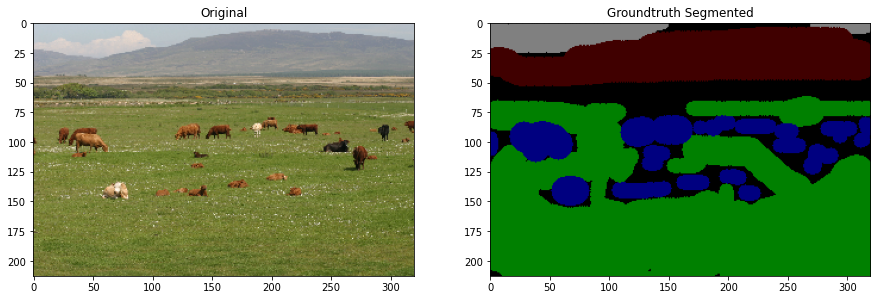

In [7]:
img_normal = load_image(data_path+"/"+images_names[0])
img_segmented = load_image(data_path+"/"+images_names[1])

f, axarr = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

axarr[0].imshow(img_normal)
axarr[0].set_title("Original")
axarr[1].imshow(img_segmented)
axarr[1].set_title("Groundtruth Segmented")

# Collect all the colors of the classes of the segmented images


In [8]:
#The values from these constants have been taken from the file .html in the dataset
VOID      = (0, np.array([0,0,0]),        "VOID")
BUILDING  = (1, np.array([128,0,0]),      "BUILDING")
GRASS     = (2, np.array([0,128,0]),      "GRASS")
TREE      = (3, np.array([128,128,0]),    "TREE")
COW       = (4, np.array([0,0,128]),      "COW")
HORSE     = (5, np.array([128,0,128]),    "HORSE")
SHEEP     = (6, np.array([0,128,128]),    "SHEEP")
SKY       = (7, np.array([128,128,128]),  "SKY")
MOUNTAIN  = (8, np.array([64,0,0]),       "MOUNTAIN")
AEROPLANE = (9, np.array([192,0,0]),      "AEROPLANE")
WATER     = (10, np.array([64,128,0]),    "WATER")
FACE      = (11, np.array([192,128,0]),   "FACE")
CAR       = (12, np.array([64,0,128]),    "CAR")
BICYCLE   = (13, np.array([192,0,128]),   "BICYCLE")

object_classes = [VOID,   BUILDING,   GRASS,  TREE,     COW,
                  HORSE,  SHEEP,      SKY,    MOUNTAIN, AEROPLANE,
                  WATER,  FACE,       CAR,    BICYCLE ]


# Show example of an image with superpixel and segmentation side by side

use SLIC for computing superpixels

REF: https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_segmentations.html

SLIC - K-Means based image segmentation

This algorithm simply performs K-means in the 5d space of color information and image location and is therefore closely related to quickshift. As the clustering method is simpler, it is very efficient. It is essential for this algorithm to work in Lab color space to obtain good results.

The compactness parameter trades off color-similarity and proximity, while n_segments chooses the number of centers for kmeans.

In [9]:
def compute_superpixels(img, compactness=10, n_segments=300):
  labels = segmentation.slic(img, compactness=compactness, n_segments=n_segments,enforce_connectivity=True)
  image = segmentation.mark_boundaries(img, labels, color=(0, 0, 0))
  image = img_as_ubyte(image)
  pixel_labels = color.label2rgb(labels, img, kind='avg', bg_label=0)
  return image, labels, pixel_labels

In [10]:
def apply_ncut(img, labels):
  # using the labels found with the superpixeled image
  # compute the Region Adjacency Graph using mean colors
  g = graph.rag_mean_color(img, labels, mode='similarity')

  # perform Normalized Graph cut on the Region Adjacency Graph
  labels2 = graph.cut_normalized(labels, g)
  image = color.label2rgb(labels2, img, kind='avg')
  return image

Text(0.5, 1.0, 'Segmented image (normalized cut)')

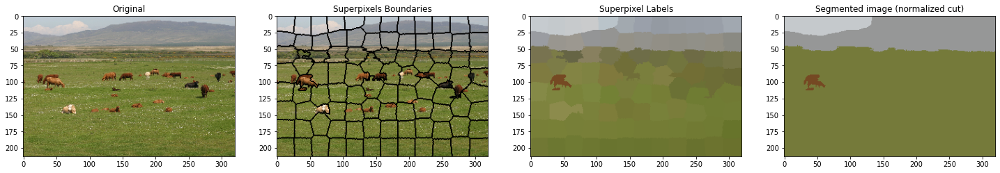

In [11]:
from skimage import data, io, segmentation, color, exposure, transform
from skimage.future import graph
from skimage.util import img_as_ubyte, img_as_float, img_as_uint, img_as_float64
from skimage.metrics import structural_similarity as ssim
import numpy as np

f, axarr = plt.subplots(nrows=1, ncols=4, figsize=(25, 20))

axarr[0].imshow(img_normal)
axarr[0].set_title("Original")

# creating superpixels using k-means
img, labels, pixel_labels = compute_superpixels(img_normal, compactness=30, n_segments=100)

#plot boundaries
axarr[1].imshow(img)
axarr[1].set_title("Superpixels Boundaries")

#plot labels
axarr[2].imshow(pixel_labels)
axarr[2].set_title('Superpixel Labels')

#compute segmentation
segmented_image = apply_ncut(img_normal, labels)
axarr[3].imshow(segmented_image)
axarr[3].set_title('Segmented image (normalized cut)')

# Metrics

In this section we define what metrics are used to compare images segmented via ncut and images representing the truth. we will use:


*   SSIM - Structural Similarity index is used as a metric to measure the similarity between two given images.
*   Intersection-Over-Union (IoU) - Given a class, the IoU is the area of overlap between the predicted segmentation class and the ground truth divided by the area of union between the predicted segmentation and the ground truth
* ARI - This is a measure of similiarity between clusters, if we assign a label as integer number to the color of the segmented image we can see the pixles as the result of a clustering algorithm. The Rand Index computes a similarity measure between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings

The problem here is that the groundtruth and the segmented image using normalized cut have different colors. To use the metrics defined above, we need both images to have the same colours.






To map the color of the predicted image with the color of the groundtruth, it is assumed that the largest regions found in prediction are similar to the largest regions in groundtruth, the colours in the regions of prediction will then be swapped with the colours of groundtruth according to the size of the regions.

Segmentation using ncut however may find more regions than groundtruth, the smaller regions will then be merged into one region, colouring them all the same colour.


In [12]:
# get list of regions and their colors ans the number of pixel for each region, sort the dict by the number of pixel
def get_list_of_colors(img):
  # Convert the image to a NumPy array
  arr = np.array(img)

  # Reshape the array
  reshaped_arr = arr.reshape(-1, 3)

  # Find the unique colors and their counts
  unique_colors, counts = np.unique(reshaped_arr, axis=0, return_counts=True)

  # Create a dictionary with color-count pairs
  color_counts = dict(zip(map(tuple, unique_colors), counts))

  # Sort the dictionary by values in descending order
  sorted_color_counts = dict(sorted(color_counts.items(), key=lambda item: item[1], reverse=True))


  return sorted_color_counts

# groundtruth
color_counts_gt = get_list_of_colors(img_segmented)
# prediction
color_counts_nc = get_list_of_colors(segmented_image)

In [13]:
color_counts_gt

{(0, 128, 0): 34081,
 (64, 0, 0): 11919,
 (0, 0, 0): 11190,
 (0, 0, 128): 7797,
 (128, 128, 128): 3173}

In [14]:
color_counts_nc

{(117, 122, 58): 51450,
 (150, 151, 151): 13086,
 (197, 201, 204): 3216,
 (117, 73, 35): 408}

In [15]:
# substitute the colors on the segmented image with ncut
def substitute_colors(img, color_counts_gt, color_counts_nc):
  if len(color_counts_nc) > len(color_counts_gt):
    for i, (k,v) in enumerate(color_counts_nc.items()):
      if i >= ( len(color_counts_gt)-1):
        color_counts_nc[k]=list(color_counts_gt.keys())[-1]

  for (k_gt,v_gt), (k_ncut,v_nct) in zip(color_counts_gt.items(), color_counts_nc.items()):
    color_counts_nc[k_ncut]=k_gt

  # Convert the image to a NumPy array
  arr = np.array(img)

  for k,v in color_counts_nc.items():
    if type(v) is tuple:
      old = list(k)
      new = list(v)

      # Define the colors to replace and their replacements
      old_color = np.array(old)
      new_color = np.array(new)
      # Create a mask for the pixels with the old color
      mask = np.all(arr == old_color, axis=-1)

      # Replace the old color pixels with the new color
      arr[mask] = new_color

  return arr

Text(0.5, 1.0, 'Groundtruth')

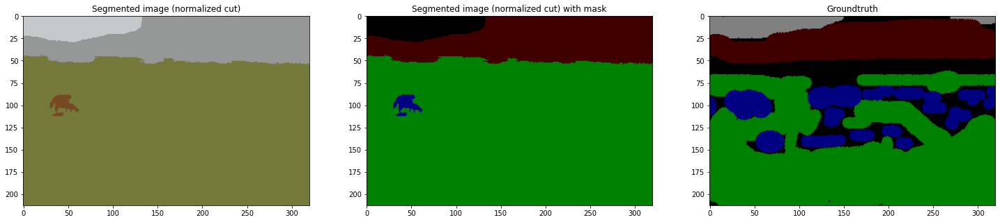

In [16]:
new_img = substitute_colors(segmented_image, color_counts_gt, color_counts_nc)

f, axarr = plt.subplots(nrows=1, ncols=3, figsize=(25, 20))

axarr[0].imshow(segmented_image)
axarr[0].set_title("Segmented image (normalized cut)")

axarr[1].imshow(new_img)
axarr[1].set_title("Segmented image (normalized cut) with mask")

axarr[2].imshow(img_segmented)
axarr[2].set_title('Groundtruth')

Lets now compare the accuracy score with the old image and the new one

In [17]:
from skimage.metrics import structural_similarity as ssim

ssim_score = ssim(segmented_image, img_segmented, channel_axis=2)
print(f"SSIM SCORE OLD: {ssim_score}")

ssim_score = ssim(new_img, img_segmented, channel_axis=2)
print(f"SSIM SCORE NEW: {ssim_score}")

SSIM SCORE OLD: 0.21549923838671103
SSIM SCORE NEW: 0.7476745719636755


In [18]:
from sklearn.metrics import jaccard_score
def iou_score(prediction, truth):
    jac = jaccard_score(y_true=np.asarray(truth).flatten(),
                        y_pred=np.asarray(prediction).flatten(),
                        average = None)
    
    # compute mean IoU score across all classes
    mean_iou = np.mean(jac)
    return mean_iou

iou = iou_score(segmented_image, img_segmented)
print(f"IOU SCORE OLD: {iou}")

iou = iou_score(new_img, img_segmented)
print(f"IOU SCORE NEW: {iou}")

IOU SCORE OLD: 0.0
IOU SCORE NEW: 0.6907483628080845


In [19]:
def compute_mask(image):
  color_dict = {}


  # Get the shape of the image
  height,width,_ = image.shape

  # Create an empty array for labels
  labels = np.zeros((height,width),dtype=int)
  id=0
  # Loop over each pixel
  for i in range(height):
      for j in range(width):
          # Get the color of the pixel
          color = tuple(image[i,j])
          # Check if it is in the dictionary
          if color in color_dict:
              # Assign the label from the dictionary
              labels[i,j] = color_dict[color]
          else:
              color_dict[color]=id
              labels[i,j] = id
              id+=1

  return(labels)

In [20]:
from sklearn.metrics import adjusted_rand_score
import skimage.segmentation as seg

def ari_score(prediction, groundtruth):
  gt_mask = compute_mask(groundtruth)
  prediction_mask = compute_mask(prediction)

  gt_mask = gt_mask.flatten()
  
  prediction_mask = prediction_mask.flatten()
  score = adjusted_rand_score(prediction_mask, gt_mask)
  
  return score

# since we assign a label to each color of the segmented image we can use the old image directly
ari = ari_score(segmented_image, img_segmented)
print(f"ARI SCORE: {ari}")


ARI SCORE: 0.4217722697421266


As we can see the accuracy increases for the metrics since we are using correct colors

# Compute image segmentation and accuracy for all the dataset

<ipython-input-22-543fac18ce9e>:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(nrows=1, ncols=3, figsize=(25, 20))


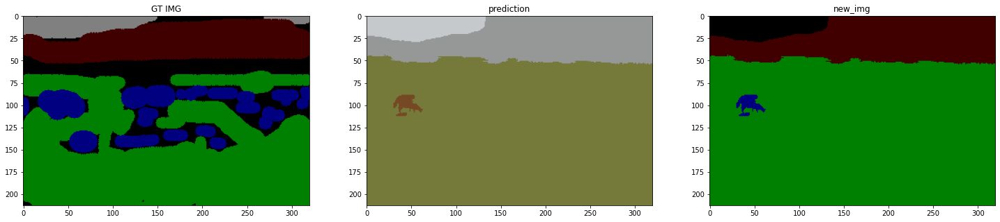

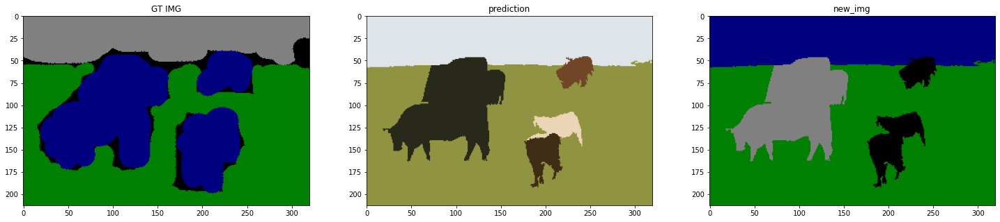

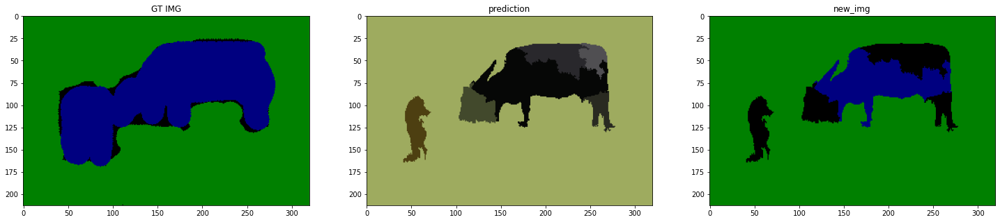

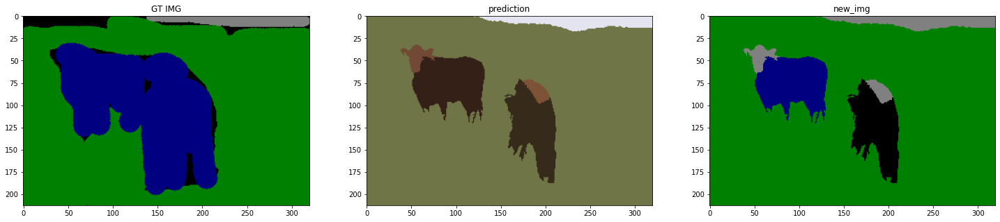

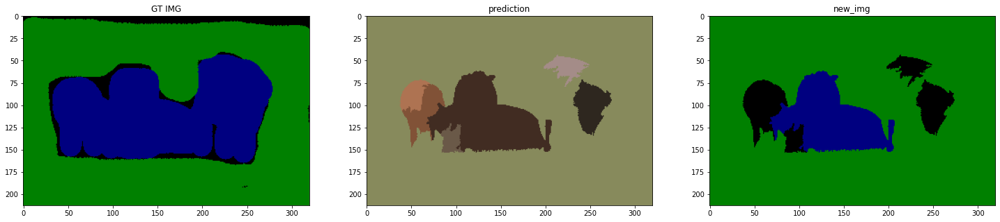

...

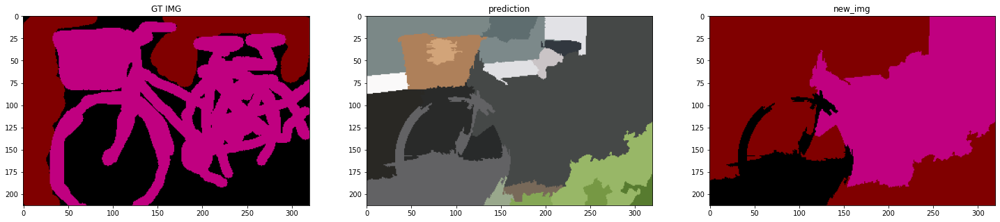

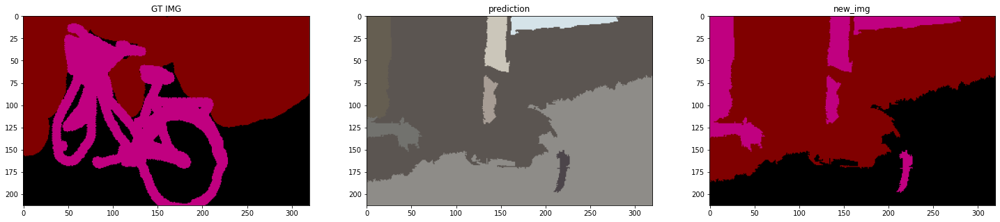

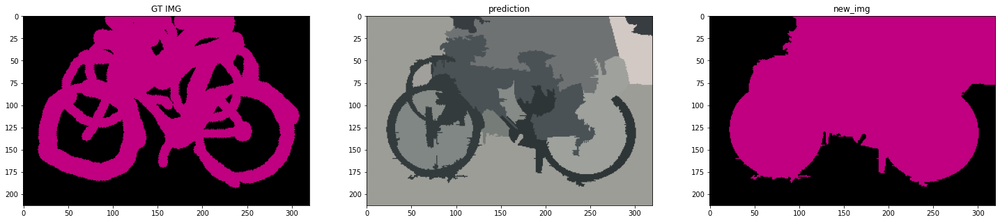

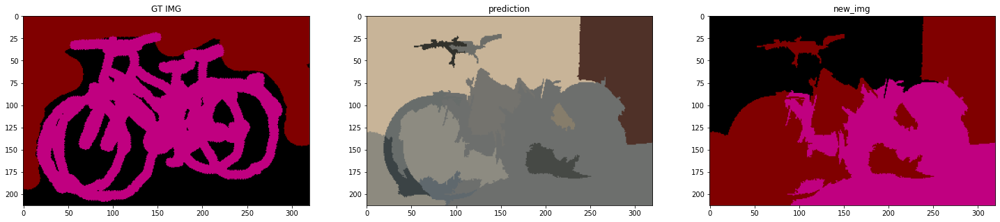

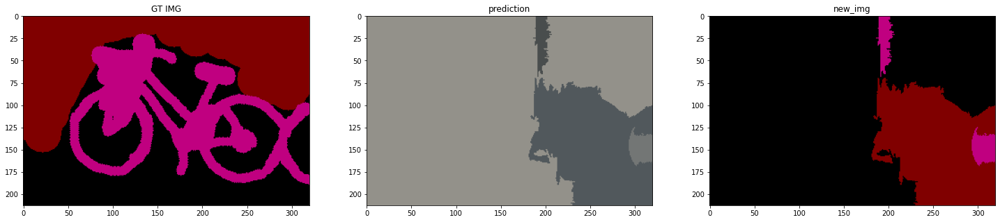

In [22]:
import pandas as pd
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import adapted_rand_error, variation_of_information
# separate segmented and not segmented files
normal_images = [s for s in images_names if "_GT" not in s]
segmented_images = [s for s in images_names if "_GT" in s]

ncut_images = []
accuracies = ["ssim_score", "iou", "ari_score"]
columns = ["Name"] + accuracies
results_df = pd.DataFrame(columns=columns)

#compute segmentation
i=0
for normal_image, gt, in zip(normal_images, segmented_images):
  # normal load image
  img_normal = load_image(data_path+"/"+normal_image)
  #load groundtruth
  img_gt = load_image(data_path+"/"+gt)

  # creating superpixels and apply ncut
  _, labels, _ = compute_superpixels(img_normal, compactness=30, n_segments=100)
  prediction = apply_ncut(img_normal, labels)

  # groundtruth
  color_counts_gt = get_list_of_colors(img_gt)
  # prediction
  color_counts_nc = get_list_of_colors(prediction)
  new_img = substitute_colors(prediction, color_counts_gt, color_counts_nc)

  ncut_images.append([gt, new_img])
  
  # compute metrics
  ssim_score = ssim(new_img, img_gt, channel_axis=2)
  #dice = dice_score(new_img, img_gt)
  iou = iou_score(new_img, img_gt)
  ari = ari_score(prediction, img_gt)


  # Insert Dict to the dataframe using DataFrame.loc()
  results_df.loc[len(results_df.index)] = [gt, ssim_score, iou, ari]

  f, axarr = plt.subplots(nrows=1, ncols=3, figsize=(25, 20))

  axarr[0].imshow(img_gt)
  axarr[0].set_title("GT IMG")
  axarr[1].imshow(prediction)
  axarr[1].set_title(f"prediction")
  axarr[2].imshow(new_img)
  axarr[2].set_title(f"new_img")
  

In [23]:
results_df

,Name,ssim_score,iou,ari_score
0,1_10_s_GT.bmp,0.747675,0.690748,0.421772
1,1_11_s_GT.bmp,0.578288,0.496987,0.592583
2,1_12_s_GT.bmp,0.844343,0.799512,0.522957
3,1_13_s_GT.bmp,0.795418,0.743687,0.427214
4,1_14_s_GT.bmp,0.805907,0.734483,0.342222
...,...,...,...,...
235,8_5_s_GT.bmp,0.639772,0.493047,0.132282
236,8_6_s_GT.bmp,0.723233,0.383911,0.199841
237,8_7_s_GT.bmp,0.686732,0.643625,0.201886
238,8_8_s_GT.bmp,0.556077,0.373769,0.178313


# Average accuracy results per class

In [24]:
cols = ["Class"] + accuracies
average_accuracy = pd.DataFrame(columns=cols)

#iter on classes
for i in range(1, 9):
  # filter the rows by name and compute the mean of accuracies
  filtered_df = results_df.loc[results_df['Name'].str.startswith(str(i)+'_'), accuracies]
  means = []
  for acc in accuracies:
    means.append(filtered_df[acc].mean())

  new_row = [i]
  for m in means:
    new_row.append(m)
  
  average_accuracy.loc[len(average_accuracy.index)] = new_row
  
average_accuracy

,Class,ssim_score,iou,ari_score
0,1.0,0.798480,0.730619,0.502401
1,2.0,0.634458,0.552184,0.348686
2,3.0,0.610180,0.510437,0.332265
3,4.0,0.654310,0.436510,0.544135
4,5.0,0.706611,0.587536,0.401498
5,6.0,0.604787,0.354921,0.095127
6,7.0,0.594825,0.367083,0.206576
7,8.0,0.564526,0.395041,0.127790


# Example of well segmented images

In [33]:
# sort the dataframe in descending order by accuracy1
df_sorted = results_df.sort_values(by='ssim_score', ascending=False)

df_sorted.head(15)

,Name,ssim_score,iou,ari_score
25,1_5_s_GT.bmp,1.000000,1.000000,0.000000
10,1_1_s_GT.bmp,1.000000,1.000000,1.000000
24,1_4_s_GT.bmp,1.000000,1.000000,1.000000
23,1_3_s_GT.bmp,1.000000,1.000000,1.000000
21,1_2_s_GT.bmp,1.000000,1.000000,0.000000
27,1_7_s_GT.bmp,1.000000,1.000000,1.000000
26,1_6_s_GT.bmp,1.000000,1.000000,1.000000
19,1_28_s_GT.bmp,0.942774,0.921157,0.000000
136,5_25_s_GT.bmp,0.927014,0.920631,0.760459
13,1_22_s_GT.bmp,0.918784,0.896073,0.717163


Since images with accuracy 1 are images of one colour with one class, I choose to display images with accuracy a little lower than one

In [31]:
def show_img(segmented_images, name):
  #load groundtruth
  img_gt = load_image(data_path+"/"+name)

  #search segmented image on the segmented images
  pred = None
  for elem in segmented_images:
    if elem[0] == name:
      pred = elem[1]

  f, axarr = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

  axarr[0].imshow(img_gt)
  axarr[0].set_title("GT")
  axarr[1].imshow(pred)
  axarr[1].set_title(f"prediction")

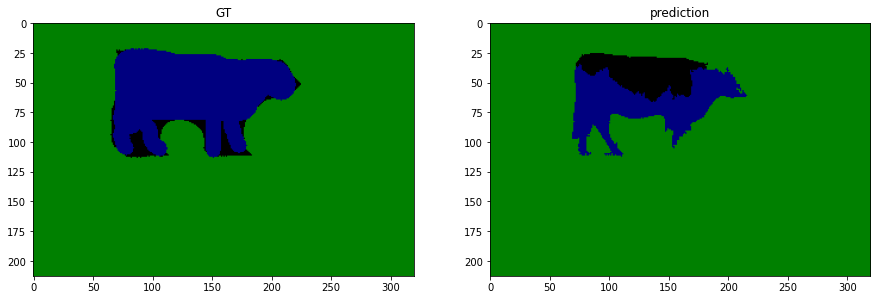

In [36]:
show_img(ncut_images, "5_25_s_GT.bmp")

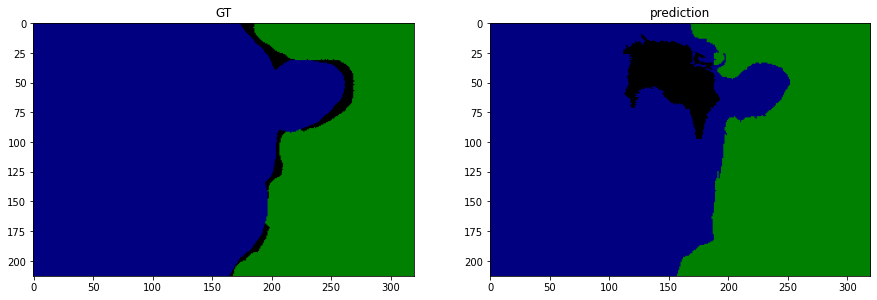

In [34]:
show_img(ncut_images, "1_22_s_GT.bmp")

# Personal notes

As we have seen, segmentation is done quite well using ncut, the problem lies in assigning the right colours to the regions found using the algorithm. Furthermore, to further improve segmentation, compactness and segments values should be defined for each image rather than chosen globally for each image as each image has different characteristics